<img src = "https://github.com/VeryFatBoy/notebooks/blob/main/common/images/img_github_singlestore-jupyter_featured_2.png?raw=true">

<div id="singlestore-header" style="display: flex; background-color: rgba(235, 249, 245, 0.25); padding: 5px;">
    <div id="icon-image" style="width: 90px; height: 90px;">
        <img width="100%" height="100%" src="https://raw.githubusercontent.com/singlestore-labs/spaces-notebooks/master/common/images/header-icons/browser.png" />
    </div>
    <div id="text" style="padding: 5px; margin-left: 10px;">
        <div id="badge" style="display: inline-block; background-color: rgba(0, 0, 0, 0.15); border-radius: 4px; padding: 4px 8px; align-items: center; margin-top: 6px; margin-bottom: -2px; font-size: 80%">SingleStore Notebooks</div>
        <h1 style="font-weight: 500; margin: 8px 0 0 4px;">Intro to Vectors</h1>
    </div>
</div>

___
## Terminology

### Dot Product

Consider two vectors (arrows) pointing in different directions. The dot product measures how much these two vectors point in the same direction. If they point in exactly the same direction, the dot product will be a large positive number. If they point in completely opposite directions, it will be a negative number. If the vectors are at a right angle (orthogonal), the dot product will be zero.

### Euclidean Distance

This measures the straight-line distance between two points, similar to using a ruler. If there are two points on a piece of paper, Euclidean distance tells us how far apart they are, like connecting the dots with a straight line.

### Cosine Similarity

Cosine similarity compares the directions of two vectors without considering their magnitudes. It measures the angle between the vectors. If the vectors point in the exact same direction, the cosine similarity is 1 (very similar). If they point in completely opposite directions, it is -1 (very different). If they are orthogonal (at a right angle), the similarity is 0 (they are unrelated).

### Principal Component Analysis (PCA)

PCA reduces the number of dimensions in a dataset while preserving as much variation as possible. It identifies the main "directions" (principal components) in the data and projects the data onto these lower dimensions to simplify analysis.

### Uniform Manifold Approximation and Projection (UMAP)

UMAP is a dimensionality reduction technique that emphasises preserving both local and global structures in data. It works by modelling the relationships between data points, keeping similar points close together while maintaining a global structure. UMAP is known for its speed and scalability, making it useful for large datasets and visualising clusters or patterns in the data.

### t-Distributed Stochastic Neighbour Embedding (t-SNE)

t-SNE is a dimensionality reduction technique that preserves the structure of the data by keeping similar points close together in a lower-dimensional space. It is useful for visualising clusters or groups of similar data points.

___
## Install libraries

In [3]:
!pip cache purge

Files removed: 0


In [4]:
!pip install matplotlib --quiet
!pip install scikit-learn --quiet
!pip install tensorflow-cpu --quiet
!pip install umap-learn --quiet

In [5]:
import ast
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import umap

from PIL import Image, ImageDraw, ImageFont

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import pairwise_distances_argmin
from sklearn.preprocessing import LabelEncoder

os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"
os.environ["TF_ENABLE_ONEDNN_OPTS"] = "0"

from tensorflow import keras
from keras.datasets import fashion_mnist

2024-09-14 23:01:14.911057: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-09-14 23:01:15.120076: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


___
## Create the database

In [6]:
shared_tier_check = %sql SHOW VARIABLES LIKE "is_shared_tier"
if not shared_tier_check or shared_tier_check[0][1] == "OFF":
    %sql DROP DATABASE IF EXISTS vector_db;
    %sql CREATE DATABASE IF NOT EXISTS vector_db;

1 rows affected.

___
## Super simple example

### Create dataset

In [7]:
# Items (words) and their vectors
words = ["cat", "dog", "car"]
vectors = np.array([[1, 2.2], [1, 1.8], [5, 5]])

# Create a DataFrame to hold the vectors and labels
words_df = pd.DataFrame({
    "Word": words,
    "X": vectors[:, 0],
    "Y": vectors[:, 1]
})

### Plot dataset

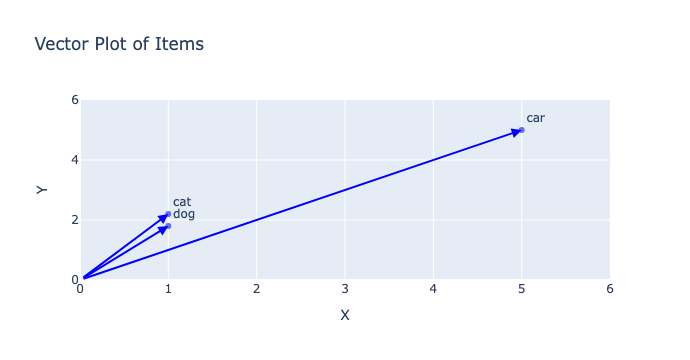

In [8]:
# Create the plot
fig_words = px.scatter(
    words_df,
    x = "X",
    y = "Y",
    text = "Word",
    title = "Vector Plot of Items",
    labels = {"X": "X", "Y": "Y"}
)

# Add arrows to represent the vectors from origin (0, 0) to the points
for i in range(len(words_df)):
    fig_words.add_annotation(
        x = words_df["X"][i], y = words_df["Y"][i],
        ax = 0, ay = 0,
        xref = "x", yref = "y",
        axref = "x", ayref = "y",
        showarrow = True,
        arrowhead = 2,
        arrowsize = 1,
        arrowwidth = 2,
        arrowcolor = "blue"
    )

# Customise the layout
fig_words.update_traces(textposition = "top right")
fig_words.update_layout(showlegend = False)
fig_words.update_xaxes(range = [0, 6])
fig_words.update_yaxes(range = [0, 6])

fig_words.show()

___
## Simple example using the <em>iris</em> dataset

### Load dataset

In [9]:
url = "https://gist.githubusercontent.com/VeryFatBoy/9af771d443f5ec4dd6eec8d69a062638/raw/c03ef25a97f23a48ee408ac02114195b663a2364/iris.csv"

read_df = pd.read_csv(url)

In [10]:
read_df.head()

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,Iris-setosa
1,4.9,3.0,1.4,0.2,Iris-setosa
2,4.7,3.2,1.3,0.2,Iris-setosa
3,4.6,3.1,1.5,0.2,Iris-setosa
4,5.0,3.6,1.4,0.2,Iris-setosa


### Plot dataset

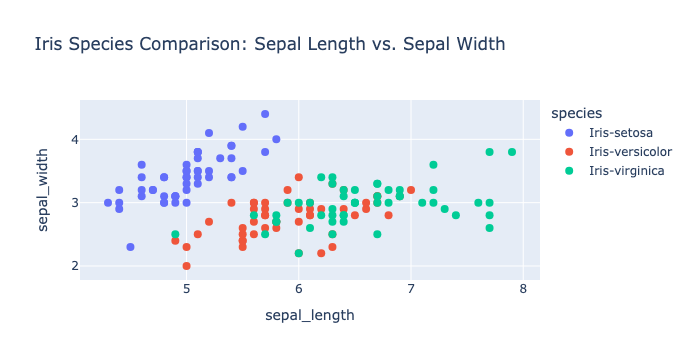

In [11]:
fig_iris_s = px.scatter(
    read_df,
    x = "sepal_length",
    y = "sepal_width",
    color = "species",
    title = "Iris Species Comparison: Sepal Length vs. Sepal Width"
)

fig_iris_s.update_traces(marker = dict(size = 8))

fig_iris_s.show()

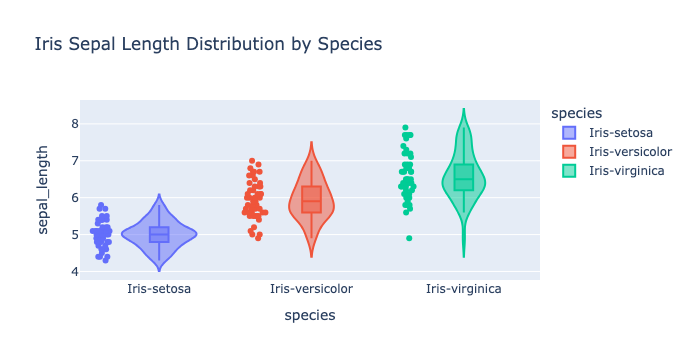

In [12]:
fig_iris_v = px.violin(
    read_df,
    x = "species",
    y = "sepal_length",
    color = "species",
    box = True,
    points = "all",
    title = "Iris Sepal Length Distribution by Species"
)

fig_iris_v.show()

### Combine four columns into a vector

In [13]:
read_df["vector"] = read_df.apply(
    lambda row: np.array([
        row["sepal_length"],
        row["sepal_width"],
        row["petal_length"],
        row["petal_width"]
    ], dtype = np.float32), axis = 1
)

write_df = read_df[["vector", "species"]]

In [14]:
write_df.head()

,vector,species
0,"[5.1, 3.5, 1.4, 0.2]",Iris-setosa
1,"[4.9, 3.0, 1.4, 0.2]",Iris-setosa
2,"[4.7, 3.2, 1.3, 0.2]",Iris-setosa
3,"[4.6, 3.1, 1.5, 0.2]",Iris-setosa
4,"[5.0, 3.6, 1.4, 0.2]",Iris-setosa


### Get the vector dimensions

In [15]:
dimensions = len(write_df.at[0, "vector"])

In [16]:
%config SqlMagic.named_parameters = "enabled"

### Create the database table

In [17]:
%%sql
%%sql
DROP TABLE IF EXISTS iris;

CREATE TABLE IF NOT EXISTS iris (
    vector VECTOR(:dimensions) NOT NULL,
    species VARCHAR(20) NOT NULL
);

++
||
++
++

In [18]:
%%sql
%%sql
DESCRIBE iris;

2 rows affected.

Field,Type,Null,Key,Default,Extra
vector,"vector(4, F32)",NO,,None,
species,varchar(20),NO,,None,


<div class="alert alert-block alert-warning">
    <b class="fa fa-solid fa-exclamation-circle"></b>
    <div>
        <p><b>Action Required</b></p>
        <p>Select the database from the drop-down menu at the top of this notebook. It updates the <b>connection_url</b> which is used by SQLAlchemy to make connections to the selected database.</p>
    </div>
</div>

In [19]:
from sqlalchemy import *

db_connection = create_engine(connection_url)

### Write DataFrame to database table

In [20]:
write_df.to_sql(
    "iris",
    con = db_connection,
    if_exists = "append",
    index = False,
    chunksize = 1000
)

150

### Check data written to database

In [21]:
check_df = pd.read_sql(
    "SELECT * FROM iris LIMIT 5;",
    con = db_connection
)

In [22]:
check_df.head()

,vector,species
0,"[5.2, 4.1, 1.5, 0.1]",Iris-setosa
1,"[5.0, 3.2, 1.2, 0.2]",Iris-setosa
2,"[6.8, 2.8, 4.8, 1.4]",Iris-versicolor
3,"[5.5, 2.4, 3.7, 1.0]",Iris-versicolor
4,"[4.6, 3.1, 1.5, 0.2]",Iris-setosa


### Create test vectors

In [23]:
highlight = "[5.9, 3, 5.1, 1.8]"
prediction = "[5.2, 3.6, 1.5, 0.3]"

### Dot Product with highlight

In [24]:
%%sql
%%sql
SELECT species
FROM iris
WHERE vector <*> (:highlight :> VECTOR(:dimensions)) = vector <*> vector;

1 rows affected.

species
Iris-virginica


### Euclidean Distance with highlight

In [25]:
%%sql
%%sql
SELECT species
FROM iris
WHERE vector <-> (:highlight :> VECTOR(:dimensions)) < 0.0001;

1 rows affected.

species
Iris-virginica


In [26]:
X = read_df[["sepal_length", "sepal_width", "petal_length", "petal_width"]]

highlight_df = pd.DataFrame(
    [ast.literal_eval(highlight)],
    columns = ["sepal_length", "sepal_width", "petal_length", "petal_width"]
)

### PCA with highlight

In [27]:
# PCA on the dataset
pca = PCA(n_components = 2)
components_pca = pca.fit_transform(X)

# Create the PCA scatter plot
fig_iris_pca = px.scatter(
    components_pca,
    x = 0,
    y = 1,
    color = read_df["species"],
    title = "PCA of Iris Dataset"
)

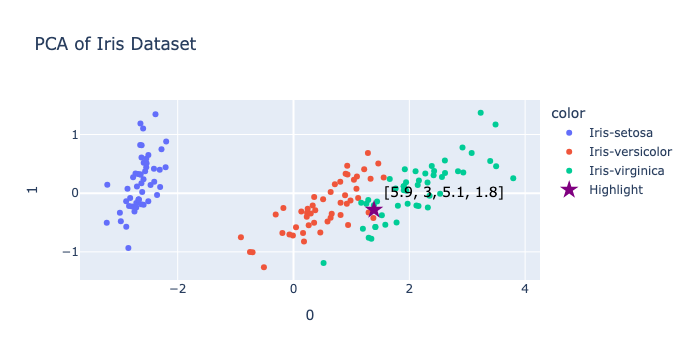

In [28]:
# Transform the point
highlight_transformed_pca = pca.transform(highlight_df)

# Add the point to the PCA plot
fig_iris_pca.add_trace(go.Scatter(
    x = [highlight_transformed_pca[0, 0]],
    y = [highlight_transformed_pca[0, 1]],
    mode = "markers+text",
    marker = dict(size = 14, color = "purple", symbol = "star"),
    text = [highlight],
    textposition = "top right",
    name = "Highlight",
    textfont = dict(size = 14, color = "black")
))

fig_iris_pca.show()

### UMAP with highlight

In [29]:
# UMAP on the dataset
umap_model = umap.UMAP(n_components = 2)
components_umap = umap_model.fit_transform(X)

# Create the UMAP scatter plot
fig_iris_umap = px.scatter(
    components_umap,
    x = 0,
    y = 1,
    color = read_df["species"],
    title = "UMAP of Iris Dataset"
)

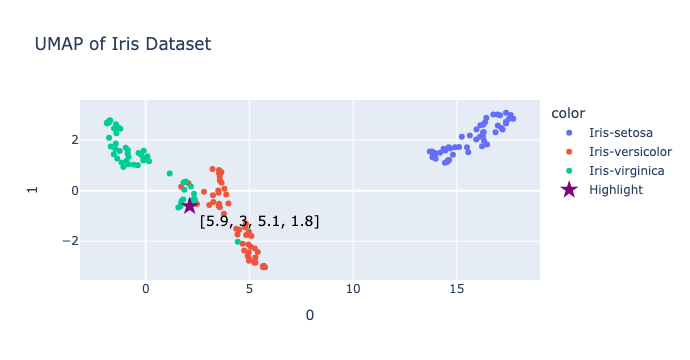

In [30]:
# Transform the point
highlight_transformed_umap = umap_model.transform(highlight_df)

# Add the point to the UMAP plot
fig_iris_umap.add_trace(go.Scatter(
    x = [highlight_transformed_umap[0, 0]],
    y = [highlight_transformed_umap[0, 1]],
    mode = "markers+text",
    marker = dict(size = 14, color = "purple", symbol = "star"),
    text = [highlight],
    textposition = "bottom right",
    name = "Highlight",
    textfont = dict(size = 14, color = "black")
))

fig_iris_umap.show()

### t-SNE with highlight

In [31]:
# t-SNE on the dataset
tsne = TSNE(n_components = 2, random_state = 42)
components_tsne = tsne.fit_transform(X)

# Create the t-SNE scatter plot
fig_iris_tsne = px.scatter(
    components_tsne,
    x = 0,
    y = 1,
    color = read_df["species"],
    title = "t-SNE of Iris Dataset"
)

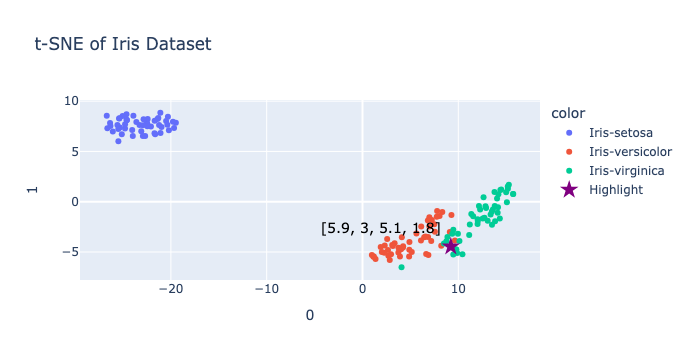

In [32]:
# Find the closest point in t-SNE space to the point
highlight_array = highlight_df.values
closest_point_idx = pairwise_distances_argmin(highlight_array, X)

# Add the point to the t-SNE plot
fig_iris_tsne.add_trace(go.Scatter(
    x = [components_tsne[closest_point_idx[0], 0]],
    y = [components_tsne[closest_point_idx[0], 1]],
    mode = "markers+text",
    marker = dict(size = 14, color = "purple", symbol = "star"),
    text = [highlight],
    textposition = "top left",
    name = "Highlight",
    textfont = dict(size = 14, color = "black")
))

fig_iris_tsne.show()

### Dot Product with prediction

In [33]:
%%sql
%%sql
SELECT species
FROM iris
ORDER BY vector <*> (:prediction :> VECTOR(:dimensions)) DESC
LIMIT 1;

1 rows affected.

species
Iris-virginica


### Euclidean Distance with prediction

In [34]:
%%sql
%%sql
SELECT species
FROM iris
ORDER BY vector <-> (:prediction :> VECTOR(:dimensions))
LIMIT 1;

1 rows affected.

species
Iris-setosa


### PCA with prediction

In [35]:
prediction_df = pd.DataFrame(
    [ast.literal_eval(prediction)],
    columns = ["sepal_length", "sepal_width", "petal_length", "petal_width"]
)

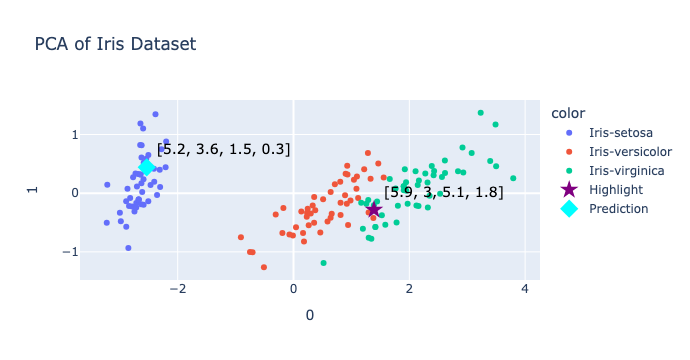

In [36]:
# Transform the point
prediction_transformed_pca = pca.transform(prediction_df)

# Add the point to the PCA plot
fig_iris_pca.add_trace(go.Scatter(
    x = [prediction_transformed_pca[0, 0]],
    y = [prediction_transformed_pca[0, 1]],
    mode = "markers+text",
    marker = dict(size = 14, color = "cyan", symbol = "diamond"),
    text = [prediction],
    textposition = "top right",
    name = "Prediction",
    textfont = dict(size = 14, color = "black")
))

fig_iris_pca.show()

### UMAP with prediction

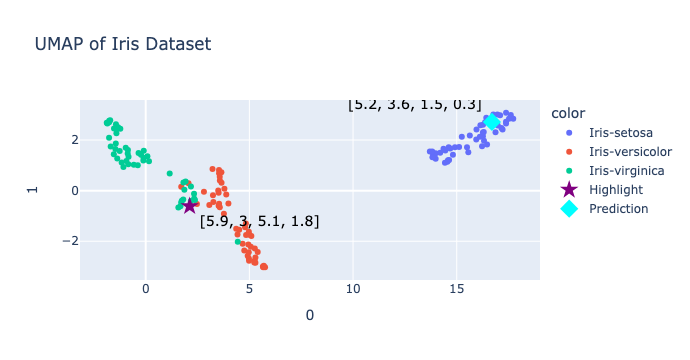

In [37]:
# Transform the point
prediction_transformed_umap = umap_model.transform(prediction_df)

# Add the point to the UMAP plot
fig_iris_umap.add_trace(go.Scatter(
    x = [prediction_transformed_umap[0, 0]],
    y = [prediction_transformed_umap[0, 1]],
    mode = "markers+text",
    marker = dict(size = 14, color = "cyan", symbol = "diamond"),
    text = [prediction],
    textposition = "top left",
    name = "Prediction",
    textfont = dict(size = 14, color = "black")
))

fig_iris_umap.show()

### t-SNE with prediction

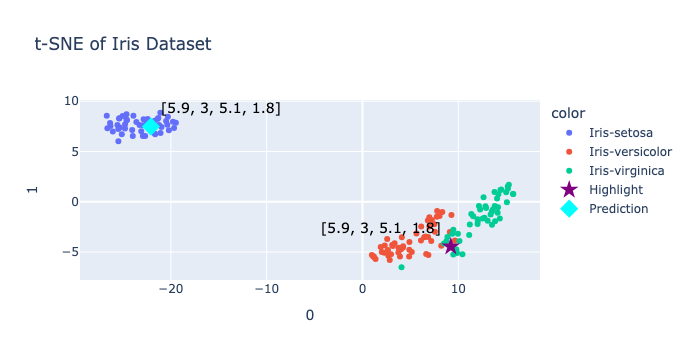

In [38]:
# Find the closest point in t-SNE space to the point
prediction_array = prediction_df.values
closest_point_idx = pairwise_distances_argmin(prediction_array, X)

# Add the point to the t-SNE plot
fig_iris_tsne.add_trace(go.Scatter(
    x = [components_tsne[closest_point_idx[0], 0]],
    y = [components_tsne[closest_point_idx[0], 1]],
    mode = "markers+text",
    marker = dict(size = 14, color = "cyan", symbol = "diamond"),
    text = [highlight],
    textposition = "top right",
    name = "Prediction",
    textfont = dict(size = 14, color = "black")
))

fig_iris_tsne.show()

___
## Larger example using the <em>Zalando</em> dataset

### Load dataset

In [39]:
(train_images, train_labels), (test_images, test_labels) = fashion_mnist.load_data()

29515/29515 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
26421880/26421880 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
5148/5148 ━━━━━━━━━━━━━━━━━━━━ 0s 1us/step
4422102/4422102 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


### Check shape

In [40]:
print("train_images: " + str(train_images.shape))
print("train_labels: " + str(train_labels.shape))
print("test_images:  " + str(test_images.shape))
print("test_labels:  " + str(test_labels.shape))

train_images: (60000, 28, 28)
train_labels: (60000,)
test_images:  (10000, 28, 28)
test_labels:  (10000,)


### Print first item as text

In [41]:
print(train_images[0])

[[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   1   0   0  13  73   0
    0   1   4   0   0   0   0   1   1   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   3   0  36 136 127  62
   54   0   0   0   1   3   4   0   0   3]
 [  0   0   0   0   0   0   0   0   0   0   0   0   6   0 102 204 176 134
  144 123  23   0   0   0   0  12  10   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0 155 236 207 178
  107 156 161 109  64  23  77 130  72  15]
 [  0   0   0   0   0   0   0   0   0   0   0   1   0  69 207 223 218 216
  216 163 127 121 122 146 141  88 172  66]
 [  0   0   0   0   0   0   0   0   0   1   1   1   0 200 232 23

### Print first item as image

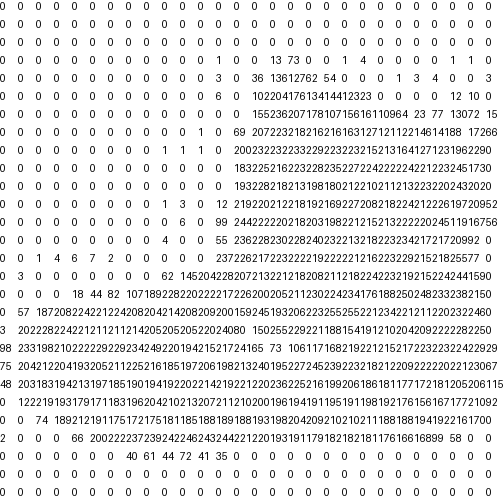

In [42]:
def text_to_image(text_array, font_size = 10, output_image = "output_image.png"):
    # Ensure the input is a 2D array
    text_array = np.array(text_array)

    # Determine the size of the image
    cell_width = cell_height = font_size
    width = cell_width * text_array.shape[1]
    height = cell_height * text_array.shape[0]

    # Create a blank image with a white background
    img = Image.new("RGB", (width, height), color = "white")

    # Initialise the drawing context
    draw = ImageDraw.Draw(img)

    # Load a font
    font = ImageFont.load_default()

    # Iterate through the text array and draw each value
    for y, row in enumerate(text_array):
        for x, value in enumerate(row):
            draw.text(
                (x * cell_width, y * cell_height),
                str(value),
                fill = "black",
                font = font
            )

    # Save the image to a file
    img.save(output_image)
    return img

# Reshape the image and render it
image_2d = train_images[0].reshape(28, 28)

image = text_to_image(image_2d, font_size = 18)
display(image)

In [43]:
print(train_labels[0])

9


### Prepare item classes

In [44]:
classes = [
    "t_shirt_top",
    "trouser",
    "pullover",
    "dress",
    "coat",
    "sandal",
    "shirt",
    "sneaker",
    "bag",
    "ankle_boot"
]

### Plot first item

Text(0.5, 1.0, 'ankle_boot')

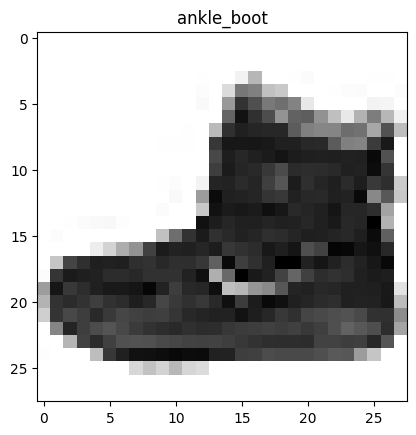

In [45]:
ax = plt.subplot(1, 1, 1)
plt.imshow(
    train_images[0],
    cmap = plt.cm.binary
)
ax.set_title(classes[train_labels[0]])

### Plot first ten items

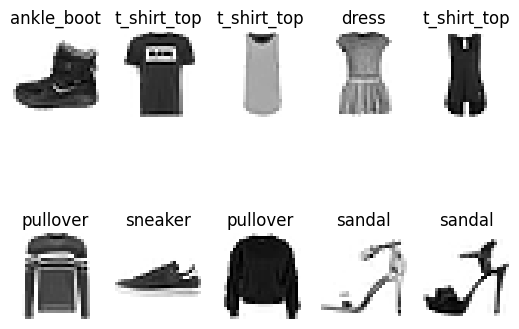

In [46]:
num_classes = len(classes)

for i in range(num_classes):
    ax = plt.subplot(2, 5, i + 1)
    plt.imshow(
        np.column_stack(train_images[i].reshape(1, 28, 28)),
        cmap = plt.cm.binary
    )
    plt.axis("off")
    ax.set_title(classes[train_labels[i]])

### Reshape to one dimension

In [47]:
train_images = train_images.reshape((train_images.shape[0], -1))
test_images = test_images.reshape((test_images.shape[0], -1))

In [48]:
print("train_images: " + str(train_images.shape))
print("test_images:  " + str(test_images.shape))

train_images: (60000, 784)
test_images:  (10000, 784)


### Prepare DataFrames

In [49]:
train_df = pd.DataFrame([
    (i,
     image.astype(int).tolist(),
     classes[int(label)],
    ) for i, (image, label) in enumerate(zip(train_images, train_labels))
], columns = ["id", "vector", "label"])

test_df = pd.DataFrame([
    (i,
     image.astype(int).tolist(),
     classes[int(label)],
    ) for i, (image, label) in enumerate(zip(test_images, test_labels))
], columns = ["id", "vector", "label"])

### Get the vector dimensions

In [50]:
dimensions = len(train_df.at[0, "vector"])

In [51]:
train_df.head()

,id,vector,label
0,0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",ankle_boot
1,1,"[0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 41, 188, 103, 5...",t_shirt_top
2,2,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 22, 118, 24, 0, 0,...",t_shirt_top
3,3,"[0, 0, 0, 0, 0, 0, 0, 0, 33, 96, 175, 156, 64,...",dress
4,4,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",t_shirt_top


In [52]:
test_df.head()

,id,vector,label
0,0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",ankle_boot
1,1,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 13, 67, 0, 0, 0...",pullover
2,2,"[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 67, 177, 129, 1...",trouser
3,3,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 21, 123, 108, 99, ...",trouser
4,4,"[0, 0, 0, 2, 0, 1, 1, 0, 0, 0, 0, 57, 67, 73, ...",shirt


In [53]:
train_df["vector"] = train_df["vector"].astype(str)
test_df["vector"] = test_df["vector"].astype(str)

<div class="alert alert-block alert-warning">
    <b class="fa fa-solid fa-exclamation-circle"></b>
    <div>
        <p><b>Action Required</b></p>
        <p>Select the database from the drop-down menu at the top of this notebook. It updates the <b>connection_url</b> which is used by SQLAlchemy to make connections to the selected database.</p>
    </div>
</div>

In [84]:
from sqlalchemy import *

db_connection = create_engine(connection_url)

### Create database tables

In [55]:
%%sql
%%sql
DROP TABLE IF EXISTS train_data;
DROP TABLE IF EXISTS test_data;

CREATE TABLE IF NOT EXISTS train_data (
    id INT(10) UNSIGNED NOT NULL,
    label VARCHAR(20) NOT NULL,
    vector VECTOR(:dimensions) NOT NULL,
    KEY(id)
);

CREATE TABLE IF NOT EXISTS test_data (
    id INT(10) UNSIGNED NOT NULL,
    label VARCHAR(20) NOT NULL,
    vector VECTOR(:dimensions) NOT NULL,
    KEY(id)
);

++
||
++
++

In [56]:
%%sql
%%sql
DESCRIBE train_data;

3 rows affected.

Field,Type,Null,Key,Default,Extra
id,int(10) unsigned,NO,MUL,None,
label,varchar(20),NO,,None,
vector,"vector(784, F32)",NO,,None,


### Write DataFrames to database tables

In [57]:
train_df.to_sql(
    "train_data",
    con = db_connection,
    if_exists = "append",
    index = False,
    chunksize = 1000
)

60000

In [58]:
test_df.to_sql(
    "test_data",
    con = db_connection,
    if_exists = "append",
    index = False,
    chunksize = 1000
)

10000

### Create ANN index

In [59]:
%%sql
%%sql
ALTER TABLE train_data ADD VECTOR INDEX (vector)
    INDEX_OPTIONS '{
        "index_type":"AUTO",
        "metric_type":"EUCLIDEAN_DISTANCE"
    }';

++
||
++
++

In [60]:
%%sql
%%sql
SHOW INDEXES FROM train_data;

2 rows affected.

Table,Non_unique,Key_name,Seq_in_index,Column_name,Collation,Cardinality,Sub_part,Packed,Null,Index_type,Comment,Index_comment,Index_options
train_data,1,id,1,id,None,None,None,None,,COLUMNSTORE HASH,,,
train_data,1,vector,1,vector,None,None,None,None,,VECTOR,,,"{ ""index_type"":""AUTO"", ""metric_type"":""EUCLIDEAN_DISTANCE"" }"


### Query train data without index

In [61]:
%%sql
%%sql
SELECT label, vector <-> (
    SELECT vector
    FROM train_data
    WHERE id = 30000) AS score
FROM train_data
ORDER BY score USE INDEX ()
LIMIT 5;

5 rows affected.

label,score
dress,0.0
dress,570.5322076798119
dress,612.5422434412177
dress,653.6390441214478
dress,665.1052548281363


### Query test data without index

In [62]:
%%sql
%%sql
SELECT label, vector <-> (
    SELECT vector
    FROM test_data
    WHERE id = 500) AS score
FROM train_data
ORDER BY score USE INDEX ()
LIMIT 5;

5 rows affected.

label,score
pullover,1211.59399140141
pullover,1295.9332544541019
pullover,1316.508640305866
pullover,1320.24278070361
pullover,1346.3539653449236


### Query train data with index

In [63]:
%%sql
%%sql
SELECT label, vector <-> (
    SELECT vector
    FROM train_data
    WHERE id = 30000) AS score
FROM train_data
ORDER BY score
LIMIT 5;

5 rows affected.

label,score
dress,0.0
dress,570.5322076798119
dress,612.5422434412177
dress,653.6390441214478
dress,676.5833282013384


### Query test data with index

In [64]:
%%sql
%%sql
SELECT label, vector <-> (
    SELECT vector
    FROM test_data
    WHERE id = 500) AS score
FROM train_data
ORDER BY score
LIMIT 5;

5 rows affected.

label,score
pullover,1211.59399140141
pullover,1316.508640305866
shirt,1360.9662009028732
shirt,1366.6458941510782
pullover,1372.1956857533112


In [65]:
sample_size = 60000

# Convert numeric labels to string labels using the mapping
string_train_labels = [classes[label] for label in train_labels]

# Convert string labels to numerical values using LabelEncoder
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(string_train_labels[:sample_size])

### PCA

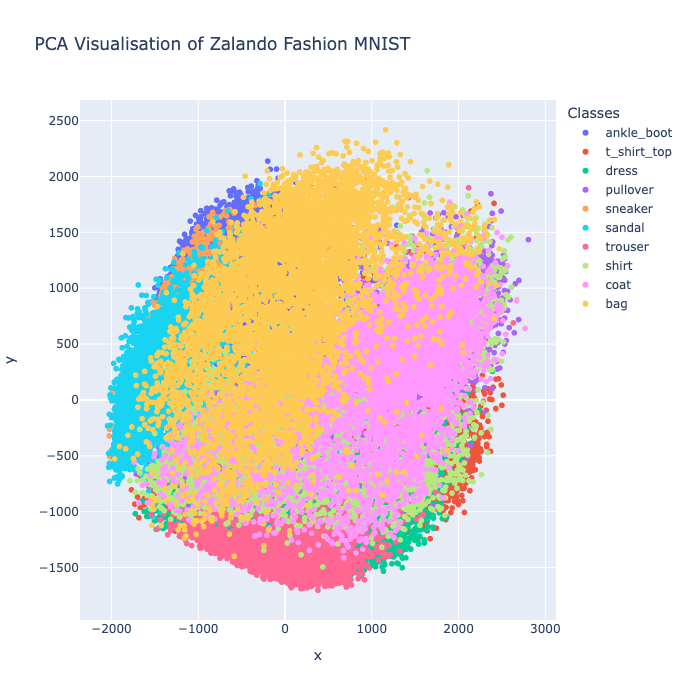

In [66]:
# Apply PCA to reduce dimensionality
pca = PCA(n_components = 2)
X_pca = pca.fit_transform(train_images[:sample_size])

# Create a new DataFrame with the PCA results and numerical labels
pca_df = pd.DataFrame(
    data = X_pca,
    columns = ["x", "y"]
)
pca_df["label"] = y_encoded
pca_df["class_name"] = label_encoder.inverse_transform(pca_df["label"])

# Plot the PCA visualization using Plotly Express
fig_fmnist_pca = px.scatter(
    pca_df,
    x = "x",
    y = "y",
    render_mode = "webgl",
    color = "class_name",
    color_continuous_scale = "rainbow",
    labels = {"class_name": "Classes"},
    title = "PCA Visualisation of Zalando Fashion MNIST"
)

# Set aspect ratio to make the plot square
fig_fmnist_pca.update_layout(
    autosize = False,
    width = 700,
    height = 700,
)

fig_fmnist_pca.show()

### UMAP

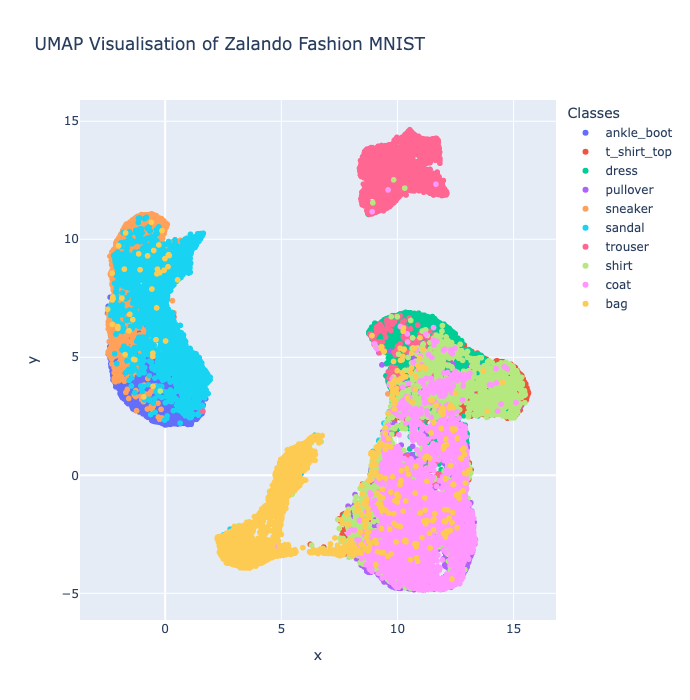

In [67]:
# Apply UMAP to reduce dimensionality
umap_model = umap.UMAP(n_components=2)
X_umap = umap_model.fit_transform(train_images[:sample_size])

# Create a new DataFrame with the UMAP results and numerical labels
umap_df = pd.DataFrame(
    data = X_umap,
    columns = ["x", "y"]
)
umap_df["label"] = y_encoded
umap_df["class_name"] = label_encoder.inverse_transform(umap_df["label"])

# Plot the UMAP visualization using Plotly Express
fig_fmnist_umap = px.scatter(
    umap_df,
    x = "x",
    y = "y",
    render_mode = "webgl",
    color = "class_name",
    color_continuous_scale = "rainbow",
    labels = {"class_name": "Classes"},
    title = "UMAP Visualisation of Zalando Fashion MNIST"
)

# Set aspect ratio to make the plot square
fig_fmnist_umap.update_layout(
    autosize = False,
    width = 700,
    height = 700,
)

fig_fmnist_umap.show()

### t-SNE

<div class="alert alert-block alert-warning">
    <b class="fa fa-solid fa-exclamation-circle"></b>
    <div>
        <p><b>Warning</b></p>
        <p>Running the following code cell may take a while.</p>
    </div>
</div>

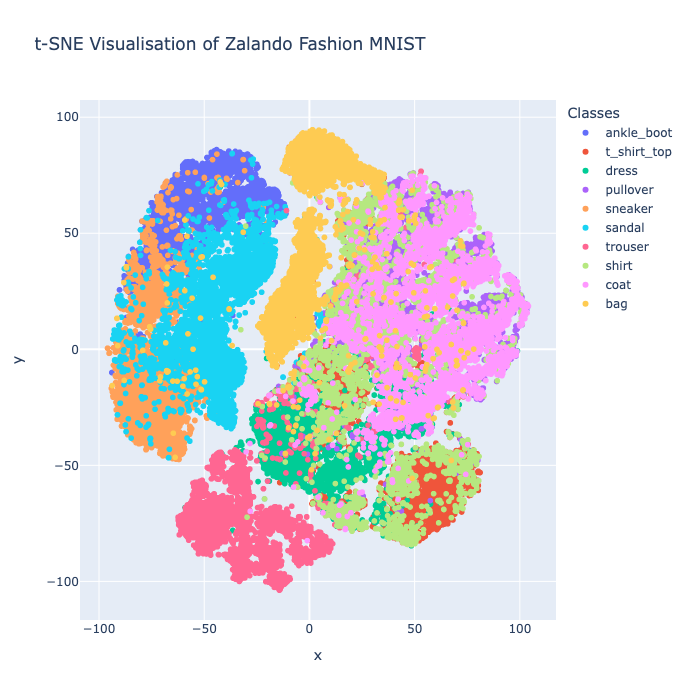

In [68]:
# Apply t-SNE to reduce dimensionality
tsne = TSNE(n_components = 2, random_state = 42)
X_tsne = tsne.fit_transform(train_images[:sample_size])

# Create a new DataFrame with the t-SNE results and numerical labels
tsne_df = pd.DataFrame(
    data = X_tsne,
    columns = ["x", "y"]
)
tsne_df["label"] = y_encoded
tsne_df["class_name"] = label_encoder.inverse_transform(tsne_df["label"])

# Plot the t-SNE visualisation using Plotly Express
fig_fmnist_tsne = px.scatter(
    tsne_df,
    x = "x",
    y = "y",
    render_mode = "webgl",
    color = "class_name",
    color_continuous_scale = "rainbow",
    labels = {"class_name": "Classes"},
    title = "t-SNE Visualisation of Zalando Fashion MNIST"
)

# Set aspect ratio to make the plot square
fig_fmnist_tsne.update_layout(
    autosize = False,
    width = 700,
    height = 700,
)

fig_fmnist_tsne.show()

___
## Cleanup

In [85]:
%%sql
%%sql
DROP INDEX vector ON train_data;

++
||
++
++

In [86]:
%%sql
%%sql
DROP TABLE IF EXISTS iris;
DROP TABLE IF EXISTS train_data;
DROP TABLE IF EXISTS test_data;

++
||
++
++

In [87]:
shared_tier_check = %sql SHOW VARIABLES LIKE "is_shared_tier"
if not shared_tier_check or shared_tier_check[0][1] == "OFF":
    %sql DROP DATABASE IF EXISTS vector_db;

1 rows affected.

___
## License

The MIT License (MIT) Copyright © [2017] Zalando SE, https://tech.zalando.com

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.